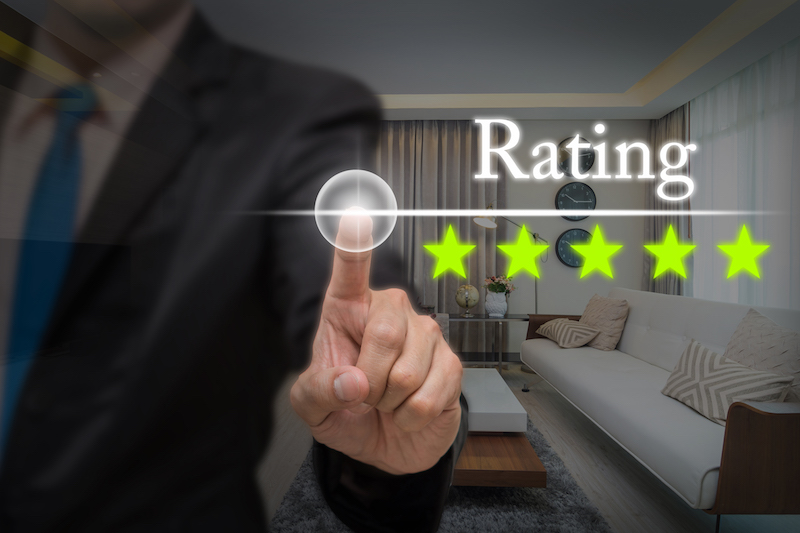

# ПРЕДСКАЗАНИЕ РЕЙТИНГА ОТЕЛЯ

In [240]:
# импортируем нужные нам для работы библиотеки
import numpy as np
from numpy import sin, cos, arccos, pi, round
import pandas as pd
!pip install category_encoders
import category_encoders as ce
!pip install plotly
import plotly
from plotly.subplots import make_subplots
import plotly.figure_factory as ff
import plotly.graph_objects as go  
import plotly.express as px

# импортируем библиотеки для визуализации
import matplotlib.pyplot as plt
import seaborn as sns 
%matplotlib inline

# импортируем библиотеки для оценки тональности текста
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer
import time


# библиотеки для работы с моделью
from sklearn.ensemble import RandomForestRegressor # инструмент для создания и обучения модели
from sklearn import metrics # инструменты для оценки точности модели
from sklearn import preprocessing
from sklearn.model_selection import cross_validate, KFold, GridSearchCV
from sklearn.model_selection import train_test_split


# загружаем специальный удобный инструмент для работы с исходными данными:
import os

In [300]:
# Считываем файл, готовим датафрейм к работе:
data_train = pd.read_csv('C:\\Users\\Admin\\Desktop\\DataFrames\\Project-3\\hotels_train.csv', delimiter=',')
data_test = pd.read_csv('C:\\Users\\Admin\\Desktop\\DataFrames\\Project-3\\hotels_test.csv', delimiter=',')
submission = pd.read_csv('C:\\Users\\Admin\\Desktop\\DataFrames\\Project-3\\submission.csv', delimiter=',')
data_train['train_test_split'] = 1
data_test['train_test_split'] = 0
data_test['reviewer_score'] = 0
hotel_data = pd.concat([data_train, data_test], axis=0, join='outer', ignore_index=True)

# ИССЛЕДОВАНИЕ И ПРЕОБРАЗОВАНИЕ ДАННЫХ

In [301]:
#Размерность данных:
hotel_data.shape

(515738, 18)

In [302]:
#Получение общей информации о столбцах и строках датафрейма:
hotel_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 515738 entries, 0 to 515737
Data columns (total 18 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   hotel_address                               515738 non-null  object 
 1   additional_number_of_scoring                515738 non-null  int64  
 2   review_date                                 515738 non-null  object 
 3   average_score                               515738 non-null  float64
 4   hotel_name                                  515738 non-null  object 
 5   reviewer_nationality                        515738 non-null  object 
 6   negative_review                             515738 non-null  object 
 7   review_total_negative_word_counts           515738 non-null  int64  
 8   total_number_of_reviews                     515738 non-null  int64  
 9   positive_review                             515738 non-null  object 
 

Сделаем небольшое ревью, в данном датафрейме часть признаков имеют тип object. Для корректной работы модели машинного обучения в последующем, нам предстоит во всех строковых признаках поменять тип данных на числовой. Также мы уже видим, что в двух столбцах отсутствует информация о геолокации отеля, что мы должны исправить в разделе очитски данных.

Сразу стоит отметить, что большинство наших данных представлено из Великобритании. Ниже будет видно, что более 50% данных мы будем именно из Великобритании. 

In [303]:
# Функция создания признака-страны:
UK = 'United Kingdom'
def get_country(arg):
    if UK in arg:
        return 'UK' 
    arg = ''.join(arg.split(' ')[-1])
    return arg

# Функция создания признака-города:
def get_city(arg):
    if UK in arg:
        arg = arg.split(' ')
        return arg[-5]
    else:
        arg = arg.split(' ')
        return arg[-2]

In [304]:
# Применяем построенныенные функции к датасету:
hotel_data['hotel_country'] = hotel_data['hotel_address'].apply(get_country)
hotel_data['hotel_city'] = hotel_data['hotel_address'].apply(get_city)

In [305]:
# Проведем подсчет каждого из значений признака страны в процентах:
hotel_data['hotel_country'].value_counts(normalize=True)

UK             0.508594
Spain          0.116627
France         0.116199
Netherlands    0.110936
Austria        0.075502
Italy          0.072143
Name: hotel_country, dtype: float64

In [306]:
# Проведем подсчет каждого из значений признака города в процентах:
hotel_data['hotel_city'].value_counts(normalize=True)

London       0.508594
Barcelona    0.116627
Paris        0.116199
Amsterdam    0.110936
Vienna       0.075502
Milan        0.072143
Name: hotel_city, dtype: float64

In [307]:
# Географические данные центра городов:

centre_lat_data = {'London': 51.3026,
                  'Barcelona': 41.23,
                  'Paris': 48.5112,
                  'Amsterdam': 52.2226,
                  'Vienna': 48.1230,
                  'Milan': 45.2800}

centre_lng_data = {'London': -00.0739,
                  'Barcelona': 2.0932,
                  'Paris': 2.2055,
                  'Amsterdam': 4.5322,
                  'Vienna': 16.2219,
                  'Milan': 09.1000}

# Создадим признак гео-данных центра городов:

df1 = pd.DataFrame.from_dict(centre_lat_data, orient='index').reset_index()
df1.rename(columns={'index': 'cities_lat', 0: 'centre_lat_data'}, inplace=True)

df2 = pd.DataFrame.from_dict(centre_lng_data, orient='index').reset_index()
df2.rename(columns={'index': 'cities_lng', 0: 'centre_lng_data'}, inplace=True)

hotel_data = hotel_data.join(df1.set_index('cities_lat'), how='left', on='hotel_city')
hotel_data = hotel_data.join(df2.set_index('cities_lng'), how='left', on='hotel_city')

Из проделанной выше работы мы делаем вывод о том, что одновременно держать признаки страны и города бессмысленно, т.к. выяснилось, что отели находятся в одних и тех же городах. В дальнейшем, один из этих признаков мы удалим, один - закодируем.
Также, только что в нашем датафрейме появились признаки гео-данных центра городов. 

In [308]:
#Проверим, в каких столбцах существуют пропущенные значения:
features_null_percent = hotel_data.isnull().mean() * 100
features_with_null = features_null_percent[features_null_percent>0].sort_values(ascending=False)
display(features_with_null)

lat    0.633655
lng    0.633655
dtype: float64

Для расчета расстояния между отелем и центром города, нам также необходимо заполнить пропущенные значения, которые, как мы выяснили находятся в гео-данных отеля.

In [309]:
# Список отелей, где у нас нет гео-данных:
mask1 = hotel_data['lat'].isnull()
mask2 = hotel_data['lng'].isnull()

hotels_without_coordinates = hotel_data[mask1 | mask2]['hotel_name'].value_counts().index.tolist()

display(hotels_without_coordinates)

['Fleming s Selection Hotel Wien City',
 'Hotel City Central',
 'Hotel Atlanta',
 'Maison Albar Hotel Paris Op ra Diamond',
 'Hotel Daniel Vienna',
 'Hotel Pension Baron am Schottentor',
 'Austria Trend Hotel Schloss Wilhelminenberg Wien',
 'Derag Livinghotel Kaiser Franz Joseph Vienna',
 'NH Collection Barcelona Podium',
 'City Hotel Deutschmeister',
 'Hotel Park Villa',
 'Cordial Theaterhotel Wien',
 'Holiday Inn Paris Montmartre',
 'Roomz Vienna',
 'Mercure Paris Gare Montparnasse',
 'Renaissance Barcelona Hotel',
 'Hotel Advance']

In [310]:
lat = pd.Series(data=[48.22005, 48.888887, 48.209333, 48.220662, 48.87526, 48.245935, 
                    48.21359, 41.386378, 48.22092, 48.186409, 48.188578, 48.2167, 48.841426, 48.233495])
np.median(lat)

lng = pd.Series(data=[16.284974, 2.333167, 16.354036, 16.355555, 2.323403, 16.341397, 
                    16.379881, 2.18676, 16.366712, 16.42017, 16.382747, 16.359983, 2.319091, 16.345556])
np.median(lng)

16.349795999999998

В коде выше проделана работа по поиску отелей, где отсутствуют гео-данные и рутинная работа по поиску самих гео-данных. В основном, как Вы могли догадаться, отели, где отсутствуют значения находятся в Вене и несколько в Париже. Поэтому будет логичным взять медианное значение из найденных и подставить его в имеющиеся пропуски.

In [311]:
hotel_data.fillna(value={'lat': 48.220355, 'lng': 16.349795}, inplace=True)

Теперь необходимо рассчитать расстояние от центра города до отеля. По-моему субъективному мнению, данный признак будет играть непоследнюю роль при обучении нашей будущей модели. Для удобства считать будем расстояниe в километрах.

In [312]:
# Подготавливаем функции для расчета в километрах:

def rad2deg(radians):
    degrees = radians * 180 / pi
    return degrees

def deg2rad(degrees):
    radians = degrees * pi / 180
    return radians

def getDistanceBetweenPointsNew(latitude1, longitude1, latitude2, longitude2, unit = 'kilometers'):
    
    theta = longitude1 - longitude2
    
    distance = 60 * 1.1515 * rad2deg(
        arccos(
            (sin(deg2rad(latitude1)) * sin(deg2rad(latitude2))) + 
            (cos(deg2rad(latitude1)) * cos(deg2rad(latitude2)) * cos(deg2rad(theta)))
        )
    )
    
    if unit == 'miles':
        return round(distance, 2)
    if unit == 'kilometers':
        return round(distance * 1.609344, 2)

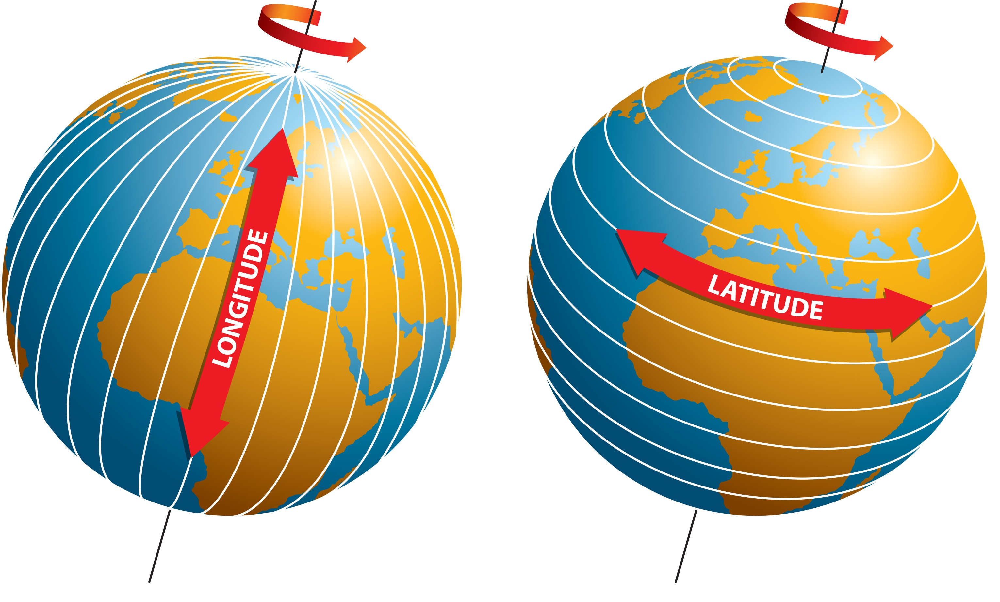

In [313]:
hotel_data['distance_from_city_center'] = getDistanceBetweenPointsNew(hotel_data['centre_lat_data'], hotel_data['centre_lng_data'], hotel_data['lat'], hotel_data['lng'])

In [314]:
pd.set_option('display.max_rows', None)

In [315]:
# Удалим теперь уже ненужные признаки:
hotel_data.drop('hotel_country', axis=1, inplace=True)
hotel_data.drop('hotel_address', axis=1, inplace=True)
hotel_data.drop('lat', axis=1, inplace=True)
hotel_data.drop('lng', axis=1, inplace=True)
hotel_data.drop('centre_lat_data', axis=1, inplace=True)
hotel_data.drop('centre_lng_data', axis=1, inplace=True)

In [316]:
hotel_data.head()

,additional_number_of_scoring,review_date,average_score,hotel_name,reviewer_nationality,negative_review,review_total_negative_word_counts,total_number_of_reviews,positive_review,review_total_positive_word_counts,total_number_of_reviews_reviewer_has_given,reviewer_score,tags,days_since_review,train_test_split,hotel_city,distance_from_city_center
0,581,2/19/2016,8.4,The May Fair Hotel,United Kingdom,Leaving,3,1994,Staff were amazing,4,7,10.0,"[' Leisure trip ', ' Couple ', ' Studio Suite ...",531 day,1,London,23.33
1,299,1/12/2017,8.3,Mercure London Bloomsbury Hotel,United Kingdom,poor breakfast,3,1361,location,2,14,6.3,"[' Business trip ', ' Couple ', ' Standard Dou...",203 day,1,London,24.52
2,32,10/18/2016,8.9,Legend Saint Germain by Elegancia,China,No kettle in room,6,406,No Positive,0,14,7.5,"[' Leisure trip ', ' Solo traveler ', ' Modern...",289 day,1,Paris,38.19
3,34,9/22/2015,7.5,Mercure Paris 19 Philharmonie La Villette,United Kingdom,No Negative,0,607,Friendly staff quiet comfortable room spotles...,11,8,10.0,"[' Leisure trip ', ' Solo traveler ', ' Standa...",681 day,1,Paris,44.21
4,914,3/5/2016,8.5,Golden Tulip Amsterdam West,Poland,Torn sheets,4,7586,The staff was very friendly and helpful Break...,20,10,9.6,"[' Business trip ', ' Couple ', ' Standard Dou...",516 day,1,Amsterdam,28.05


Итак, мы закончили объемную работу с геоданными, получив ценные данные и также избавились от ненужных признаков после преобразований. Подводя итоги, сделаем следующие выводы: 

1) Как Вы могли понять, из столбца "hotel_address" мы получили информацию о том, в какой стране и в каком городе находится отель. Из полученных результатов, мы видим, что данные полностью совпадают, т.е. туристы практически всегда летят в столицу посещаемой ими страны. А это означает, что мы должны избавиться от признака страны, поскольку он несет никакой практической пользы, слишком неопределенный.

2) Признак hotel_city закодируем ниже, используя One-Hot Encoding, т.е. создадим новый бинарный признак для каждого города.

3) Из признаков lat и lng получилось создать расстояния в километрах от каждого отеля до центра города. В дальнейшем, мы проверим коррелируемость данного признака. Плюс ко всему, мы также провели небольшую работу по заполнению пропущенных значений в признаках долготы и широты.

In [317]:
# Кодируем признак города-отеля:
encoder = ce.OneHotEncoder(cols=['hotel_city'], use_cat_names=True) 
hotel_city = encoder.fit_transform(hotel_data['hotel_city'])
hotel_data = pd.concat([hotel_data, hotel_city], axis=1)

hotel_data.head()

,additional_number_of_scoring,review_date,average_score,hotel_name,reviewer_nationality,negative_review,review_total_negative_word_counts,total_number_of_reviews,positive_review,review_total_positive_word_counts,...,days_since_review,train_test_split,hotel_city,distance_from_city_center,hotel_city_London,hotel_city_Paris,hotel_city_Amsterdam,hotel_city_Milan,hotel_city_Vienna,hotel_city_Barcelona
0,581,2/19/2016,8.4,The May Fair Hotel,United Kingdom,Leaving,3,1994,Staff were amazing,4,...,531 day,1,London,23.33,1,0,0,0,0,0
1,299,1/12/2017,8.3,Mercure London Bloomsbury Hotel,United Kingdom,poor breakfast,3,1361,location,2,...,203 day,1,London,24.52,1,0,0,0,0,0
2,32,10/18/2016,8.9,Legend Saint Germain by Elegancia,China,No kettle in room,6,406,No Positive,0,...,289 day,1,Paris,38.19,0,1,0,0,0,0
3,34,9/22/2015,7.5,Mercure Paris 19 Philharmonie La Villette,United Kingdom,No Negative,0,607,Friendly staff quiet comfortable room spotles...,11,...,681 day,1,Paris,44.21,0,1,0,0,0,0
4,914,3/5/2016,8.5,Golden Tulip Amsterdam West,Poland,Torn sheets,4,7586,The staff was very friendly and helpful Break...,20,...,516 day,1,Amsterdam,28.05,0,0,1,0,0,0


In [318]:
# Разберем признак "дата и время". Этот признак представлен в виде мм/дд/гггг:
hotel_data['date'] = pd.to_datetime(hotel_data['review_date'])

In [260]:
def get_season(month):
    if month in [1, 2, 12]:
        return 1
    elif month in [3, 4, 5]:
        return 2
    elif month in [6, 7, 8]:
        return 3
    elif month in [9, 10, 11]:
        return 4

In [261]:
hotel_data['month'] = hotel_data['date'].dt.month
hotel_data['day_of_year'] = hotel_data['date'].dt.dayofyear
hotel_data['season'] = hotel_data['month'].apply(get_season)
hotel_data.drop(['review_date', 'date'], axis=1, inplace=True)


In [262]:
hotel_data.head()

,additional_number_of_scoring,average_score,hotel_name,reviewer_nationality,negative_review,review_total_negative_word_counts,total_number_of_reviews,positive_review,review_total_positive_word_counts,total_number_of_reviews_reviewer_has_given,...,distance_from_city_center,hotel_city_London,hotel_city_Paris,hotel_city_Amsterdam,hotel_city_Milan,hotel_city_Vienna,hotel_city_Barcelona,month,day_of_year,season
0,581,8.4,The May Fair Hotel,United Kingdom,Leaving,3,1994,Staff were amazing,4,7,...,23.33,1,0,0,0,0,0,2,50,1
1,299,8.3,Mercure London Bloomsbury Hotel,United Kingdom,poor breakfast,3,1361,location,2,14,...,24.52,1,0,0,0,0,0,1,12,1
2,32,8.9,Legend Saint Germain by Elegancia,China,No kettle in room,6,406,No Positive,0,14,...,38.19,0,1,0,0,0,0,10,292,4
3,34,7.5,Mercure Paris 19 Philharmonie La Villette,United Kingdom,No Negative,0,607,Friendly staff quiet comfortable room spotles...,11,8,...,44.21,0,1,0,0,0,0,9,265,4
4,914,8.5,Golden Tulip Amsterdam West,Poland,Torn sheets,4,7586,The staff was very friendly and helpful Break...,20,10,...,28.05,0,0,1,0,0,0,3,65,2


In [263]:
# Воспользуемся двоичным кодированием и закодируем признак национальности ревьюера:
bin_encoder = ce.BinaryEncoder(cols=['reviewer_nationality'])
reviewer_bin = bin_encoder.fit_transform(hotel_data['reviewer_nationality'])
hotel_data = pd.concat([hotel_data,reviewer_bin], axis=1)

Нам осталось разобрать самые тяжелые, насыщенные информацией, очень важные признаки негативных, положительных отзывов и тэгов.

In [264]:
# Признаки положительных и негативных отзывов превратим в булевые переменные:
absence = ['No Positive', ' No Negative ', ' No Negative', 'No Negative', ' No ', '', ' ', ' Nothing', 'Nothing', ' Nothing ', ' nothing', 'nothing', ' N A ', ' None ', ' N a ']
hotel_data['negative_review'] = hotel_data['negative_review'].apply(lambda x: False if x in absence else True)
hotel_data['positive_review'] = hotel_data['positive_review'].apply(lambda x: False if x in absence else True)

In [265]:
# Уберем квадратные скобки, и преобразуем строку в список тегов:
hotel_data['tags'] = hotel_data['tags'].apply(lambda x: x[1:] if x[0:] == '[' else x)
hotel_data['tags'] = hotel_data['tags'].apply(lambda x: x[:-1] if x[-1:] == ']' else x)

hotel_data['tags'] = hotel_data['tags'].apply(lambda x: x.replace('\' ', ''))
hotel_data['tags'] = hotel_data['tags'].apply(lambda x: x.replace(' \'', ''))

In [266]:
# Создадим функцию, которая будет искать слова в списке тегов для создания в дальнейшем булевых признаков:
def get_target(words, x):    
    if x in words:
        return 1
    else:
        return 0

In [267]:
# Создаем основные признаки на основе тегов:
hotel_data['Leisure_trip'] = hotel_data['tags'].apply(lambda x: get_target(x,'Leisure trip'))
hotel_data['Business_trip'] = hotel_data['tags'].apply(lambda x: get_target(x,'Business trip'))
hotel_data['Solo_traveler'] = hotel_data['tags'].apply(lambda x: get_target(x,'Solo traveler'))
hotel_data['Couple'] = hotel_data['tags'].apply(lambda x: get_target(x,'Couple'))
hotel_data['Group'] = hotel_data['tags'].apply(lambda x: get_target(x,'Group'))
hotel_data['Family_with_older_children'] = hotel_data['tags'].apply(lambda x: get_target(x,'Family with older children'))
hotel_data['Family_with_young_children'] = hotel_data['tags'].apply(lambda x: get_target(x,'Family with young children'))

In [270]:
hotel_data['stayed_nights'] = hotel_data['tags'].apply(
    lambda x:
    1 if 'Stayed 1 night' in x else
    2 if 'Stayed 2 nights' in x else
    3 if 'Stayed 3 nights' in x else
    4 if 'Stayed 4 nights' in x else
    5 if 'Stayed 5 nights' in x else
    6 if 'Stayed 6 nights' in x else
    7 if 'Stayed 7 nights' in x else
    8 if 'Stayed 8 nights' in x else
    9 if 'Stayed 9 nights' in x else
    10 if 'Stayed 10 nights' in x else
    11 if 'Stayed 11 nights' in x else
    12 if 'Stayed 12 nights' in x else
    13 if 'Stayed 13 nights' in x else
    14 if 'Stayed 14 nights' in x else
    15 if 'Stayed 15 nights' in x else
    16 if 'Stayed 16 nights' in x else
    17 if 'Stayed 17 nights' in x else
    18 if 'Stayed 18 nights' in x else
    19 if 'Stayed 19 nights' in x else
    20 if 'Stayed 20 nights' in x else
    21 if 'Stayed 21 nights' in x else
    22 if 'Stayed 22 nights' in x else
    23 if 'Stayed 23 nights' in x else
    24 if 'Stayed 24 nights' in x else
    25 if 'Stayed 25 nights' in x else
    26 if 'Stayed 26 nights' in x else
    27 if 'Stayed 27 nights' in x else
    28 if 'Stayed 28 nights' in x else
    29 if 'Stayed 29 nights' in x else
    30 if 'Stayed 30 nights' in x else
    31 if 'Stayed 31 nights' in x else 0
)

hotel_data.drop(['tags'], axis=1, inplace=True)

In [271]:
# Функция, с помощью которой мы сможем достать из строки число:
def get_integers(arg):
    x = ''
    arg.split()
    for e in arg:
        if e.isdigit():
            x += e
    return int(x)

In [272]:
# Избавимся от слова "days" в признаке days_since_review и преобразуем тип данных:
hotel_data['days_since_review'] = hotel_data['days_since_review'].apply(get_integers)

In [273]:
hotel_data.head()

,additional_number_of_scoring,average_score,hotel_name,reviewer_nationality,negative_review,review_total_negative_word_counts,total_number_of_reviews,positive_review,review_total_positive_word_counts,total_number_of_reviews_reviewer_has_given,...,reviewer_nationality_6,reviewer_nationality_7,Leisure_trip,Business_trip,Solo_traveler,Couple,Group,Family_with_older_children,Family_with_young_children,stayed_nights
0,581,8.4,The May Fair Hotel,United Kingdom,True,3,1994,True,4,7,...,0,1,1,0,0,1,0,0,0,2
1,299,8.3,Mercure London Bloomsbury Hotel,United Kingdom,True,3,1361,True,2,14,...,0,1,0,1,0,1,0,0,0,1
2,32,8.9,Legend Saint Germain by Elegancia,China,True,6,406,False,0,14,...,1,0,1,0,1,0,0,0,0,3
3,34,7.5,Mercure Paris 19 Philharmonie La Villette,United Kingdom,False,0,607,True,11,8,...,0,1,1,0,1,0,0,0,0,1
4,914,8.5,Golden Tulip Amsterdam West,Poland,True,4,7586,True,20,10,...,1,1,0,1,0,1,0,0,0,6


In [274]:
hotel_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 515738 entries, 0 to 515737
Data columns (total 40 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   additional_number_of_scoring                515738 non-null  int64  
 1   average_score                               515738 non-null  float64
 2   hotel_name                                  515738 non-null  object 
 3   reviewer_nationality                        515738 non-null  object 
 4   negative_review                             515738 non-null  bool   
 5   review_total_negative_word_counts           515738 non-null  int64  
 6   total_number_of_reviews                     515738 non-null  int64  
 7   positive_review                             515738 non-null  bool   
 8   review_total_positive_word_counts           515738 non-null  int64  
 9   total_number_of_reviews_reviewer_has_given  515738 non-null  int64  
 

Таким образом, мы провели огромную работу по исследованию и преобразованию датасета. МЫ избавились от всех строковых значений, каждое по разному преобразовав в числовое. Кроме того, вследствие данных преобразований появились множество новых важных признаков для обучения модели. Следующим этапом будет визуализация полученного датасета. Нам необходимо рассмотреть корреляции в данных, посмотреть выбросы и сделать выводы по зависимостям.

In [275]:
# После всех преобразований, проведем разделение на тренировачные и тестовые данные:
train_data = pd.DataFrame(hotel_data.query('train_test_split == 1').drop(['train_test_split'], axis=1).drop_duplicates())

test_data = pd.DataFrame(hotel_data.query('train_test_split == 0').drop(['train_test_split'], axis=1))

# ВИЗУАЛИЗАЦИЯ И ОЧИСТКА ДАННЫХ

In [276]:
corrs = train_data.corr()

fig = go.Figure()

fig.add_trace(go.Heatmap(
    z= corrs.values,
    x= list(corrs.columns),
    y= list(corrs.index),
    ))

fig.update_layout(
    title="Тепловая карта признаков",
    autosize=False,
    width=1000,
    height=800,
    margin=dict(l=30,r=30,b=30,
                t=30,pad=3
                ),
    paper_bgcolor="lightsteelblue",
)

fig.show()

Мы можем наблюдать ряд полей, которые сильно коррелируют друг с другом. К таким относятся связки ("month - day_of_year", "Leisure_trip - Business_trip" и "total_number_of_reviews - additional_number_of_scoring"). Данные признаки создают мультиколлинеарность, и нам необходимо от нее избавиться. Те признаки, которые сильно коррелированы, нужно удалить, чтобы они не несли одну и ту же информацию.

In [277]:
train_data.drop(['day_of_year', 'additional_number_of_scoring', 'Business_trip'], axis=1, inplace=True)
test_data.drop(['day_of_year', 'additional_number_of_scoring', 'Business_trip'], axis=1, inplace=True)

Далее, для отбора признаков, мы будем исследовать признаки, которые могут повлиять на целевой.

In [278]:
fig = make_subplots(rows=1, cols=2)

fig.add_trace(go.Histogram(x=train_data['reviewer_score'], name='Начальный показатель оценки'), row=1, col=1)

fig.update_xaxes(title_text="Начальный показатель оценки", row=1, col=1)

fig.add_trace(go.Histogram(x=train_data['average_score'], name='Средний показатель оценки'), row=1, col=2)

fig.update_xaxes(title_text="Средний показатель оценки", row=1, col=2)

fig.update_layout(title_text="Оценка отелей")
fig.show()

Мы видим, что большинство показателей средней оценки находятся между 8 и 9, в то время, как начальная оценка распределилась по возрастанию показателей.

In [279]:
mask1 = train_data.pivot_table(values='reviewer_score',
                               index='month',
                               columns='reviewer_nationality',
                               aggfunc='mean')

fig = go.Figure()

fig.add_trace(go.Heatmap(z= mask1.values,
                        x= list(mask1.columns),
                        y= list(mask1.index)))

fig.update_layout(
    title="Тепловая карта оценок рецензентов в зависимоти от месяца и гражданства",
    autosize=False,
    width=1000,
    height=800,
    margin=dict(l=30,r=30,b=30,
                t=30,pad=3
                ),
    paper_bgcolor="lightsteelblue",
)


fig.update_xaxes(title="Гражданство рецензента")
fig.update_yaxes(title="Месяц выставления оценки")


fig.show()

Таким образом, по данной тепловой карте, мы имеем возможность отследить взаимосвязь того, в какие месяцы чаще всего путешествуют туристы и гражданами какой страны они являются. Например, жители Израиля и Индии оставляют свои отзывы каждый месяц года, а граждане Сан-Марино и Самоа путешевствуют крайне редко. Также исходя из представленного графика, мы делаем вывод, что те, кто путешевствует реже оставляют более положительные оценки о отзывы, чем те, кто делает это чаще.

In [280]:
mask1 = train_data.groupby('hotel_city', as_index=False)['reviewer_score'].mean()

fig = px.bar(mask1,
            y='reviewer_score',
            x='hotel_city',
            title='Средняя оценка в зависимости от города отеля',
            color='hotel_city')

fig.update_xaxes(title="Город")
fig.update_yaxes(title="Средняя оценка")


fig.show()

In [281]:
train_data['distance_from_city_center'] = train_data['distance_from_city_center'].replace(1364.96, train_data['distance_from_city_center'].median())
train_data['distance_from_city_center'] = train_data['distance_from_city_center'].replace(1043.87, train_data['distance_from_city_center'].median())

mask1 = train_data.groupby('distance_from_city_center', as_index=False)['reviewer_score'].mean()

fig = px.scatter(mask1,
                 y='reviewer_score',
                 x='distance_from_city_center',
                 color='distance_from_city_center',
                 title='Средняя оценка в зависимости от удаленности отеля от центра города',
                 width=700,
                 height=600)

fig.update_xaxes(title="Расстояние")
fig.update_yaxes(title="Оценка")


fig.show()


Мы наблюдаем, что данные расположены хаотично, это означает, что признак не сильно влияет на целевую переменную. Также в поле выше, мы провели небольшую очистку данных - заменив выбросы медианным значением.

In [282]:
mask1 = train_data.groupby('negative_review')['reviewer_score'].mean()
mask2 = train_data.groupby('positive_review')['reviewer_score'].mean()

fig = make_subplots(rows=1, cols=2)

fig.add_trace(go.Bar(y=mask1, name='Негативный параметр'), row=1, col=1)

fig.update_xaxes(title_text="Показатель негативной оценки", row=1, col=1)

fig.add_trace(go.Bar(y=mask2, name='Положительный параметр'), row=1, col=2)

fig.update_xaxes(title_text="Показатель положительной оценки", row=1, col=2)

fig.update_layout(title_text="Оценка отелей")
fig.show()

Даже при условии того, что у нас активный негативный фактор (в значении 1), все равно средняя оценка отелей стремится к 8 баллам, а это довольно высокий резельтат. А вот, если отсутствует положительные комментарии, то это приведет к отрицательной оценке, мы видим, что при таких условиях, средняя оценка - 6.74, а это значительно ниже остальных категорий.

In [283]:
mask1 = train_data.groupby('review_total_negative_word_counts', as_index=False)['reviewer_score'].mean()
mask2 = train_data.groupby('review_total_positive_word_counts', as_index=False)['reviewer_score'].mean()

fig = go.Figure()

fig.add_trace(go.Line(y=mask1['reviewer_score'],
                      x=mask1['review_total_negative_word_counts'],
                      name='Количество негативных слов'))


fig.add_trace(go.Line(y=mask2['reviewer_score'],
                      x=mask2['review_total_positive_word_counts'],
                      name='Количество позитивных слов'))

fig.update_layout(
    title="Зависимоть средней оценки отелей от количества слов в отзыве",
    autosize=False,
    width=1000,
    height=600,
    margin=dict(l=30,r=30,b=30,
                t=30,pad=3),
    paper_bgcolor="lightsteelblue",
)

fig.update_xaxes(title="Количество слов")
fig.update_yaxes(title="Оценка")


fig.show()

C:\ProgramData\Anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:378: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




Чем меньше негативных слов - тем оценка отеля выше. С положительными отзывами ситуация интереснее, мы наблюдаем, что тем меньше положительных слов в отзыве, тем меньше и оценка, но если положительный отзыв по объему огромный, то наблюдаются некоторые просадки, которые понижают оценку отеля, что является необычным явлением.

In [284]:
train_data.drop(['hotel_name', 'reviewer_nationality', 'hotel_city'], axis=1, inplace=True)
test_data.drop(['hotel_name', 'reviewer_nationality', 'hotel_city', 'reviewer_score'], axis=1, inplace=True)

In [285]:
# Поиск дубликатов:
dupl_columns = list(train_data.columns)
mask = train_data.duplicated(subset=dupl_columns)
train_data_duplicates = train_data[mask]
print(f'Число найденных дубликатов: {train_data_duplicates.shape[0]}')
train_data = train_data.drop_duplicates(subset=dupl_columns)

Число найденных дубликатов: 0


In [286]:
# Число пропусков в столбцах
colls_null_percent = train_data.isnull().mean() * 100
cols_with_null = colls_null_percent[colls_null_percent>0].sort_values(ascending=False)
display(colls_null_percent)

average_score                                 0.0
negative_review                               0.0
review_total_negative_word_counts             0.0
total_number_of_reviews                       0.0
positive_review                               0.0
review_total_positive_word_counts             0.0
total_number_of_reviews_reviewer_has_given    0.0
reviewer_score                                0.0
days_since_review                             0.0
distance_from_city_center                     0.0
hotel_city_London                             0.0
hotel_city_Paris                              0.0
hotel_city_Amsterdam                          0.0
hotel_city_Milan                              0.0
hotel_city_Vienna                             0.0
hotel_city_Barcelona                          0.0
month                                         0.0
season                                        0.0
reviewer_nationality_0                        0.0
reviewer_nationality_1                        0.0


# ОБУЧЕНИЕ МОДЕЛИ МАШИННОГО ОБУЧЕНИЯ

In [287]:
# Обозначим наши переменные:
y = train_data.reviewer_score.values
X = train_data.drop(['reviewer_score'], axis=1)

In [288]:
# Разбиваем подготовленные данные на train и test:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

In [289]:
# Создаем модель:
model = RandomForestRegressor(n_estimators=100, verbose=1, n_jobs=-1, random_state=1)

In [290]:
#Обучение модели:
model.fit(X_train, y_train)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  5.0min finished


RandomForestRegressor(n_jobs=-1, random_state=1, verbose=1)

In [291]:
y_pred = model.predict(X_test)

[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    1.6s
[Parallel(n_jobs=2)]: Done 100 out of 100 | elapsed:    3.4s finished


In [292]:
print('MAPE:', metrics.mean_absolute_percentage_error(y_test, y_pred))

MAPE: 0.134397160458343


In [293]:
mask = pd.Series(model.feature_importances_, index=X.columns)
fig = px.histogram(mask.nlargest(40),
                  y=X.columns,
                  x=model.feature_importances_,
                  color=X.columns,
                  height=800,
                  width=1000)

fig.update_layout(showlegend=False)
fig.update_xaxes(title="Уровень влияния на целевой признак")
fig.update_yaxes(title="Признаки датасета")

fig.show()

In [294]:
# Обучаем модель на тестовых данных:
predict_test_iteration = model.predict(test_data)

[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    2.9s
[Parallel(n_jobs=2)]: Done 100 out of 100 | elapsed:    6.7s finished


In [295]:
predict_test_iteration

array([8.553, 7.493, 8.242, ..., 7.775, 9.404, 7.126])

In [296]:
submission['reviewer_score'] = predict_test_iteration

In [298]:
submission.to_csv('submission.csv', index=False)
submission.head(10)

,reviewer_score,id
0,8.553,488440
1,7.493,274649
2,8.242,374688
3,9.591,404352
4,9.776,451596
5,8.264,302161
6,8.185,317079
7,7.905,13963
8,8.540,159785
9,7.931,195089
